**<h1> Manipulating Images </h1>**


Estimated time needed: **30** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, OpenCV image Arrays. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab


In [2]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


We will be using these imported functions in the lab


In [3]:
import matplotlib.pyplot as plt#Thư viện dùng để vẽ biểu đồ và hiển thị ảnh
import cv2#Thư viện xử lý ảnh & video
import numpy as np#Thư viện thuật toán dưới dạng mảng

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the following array:


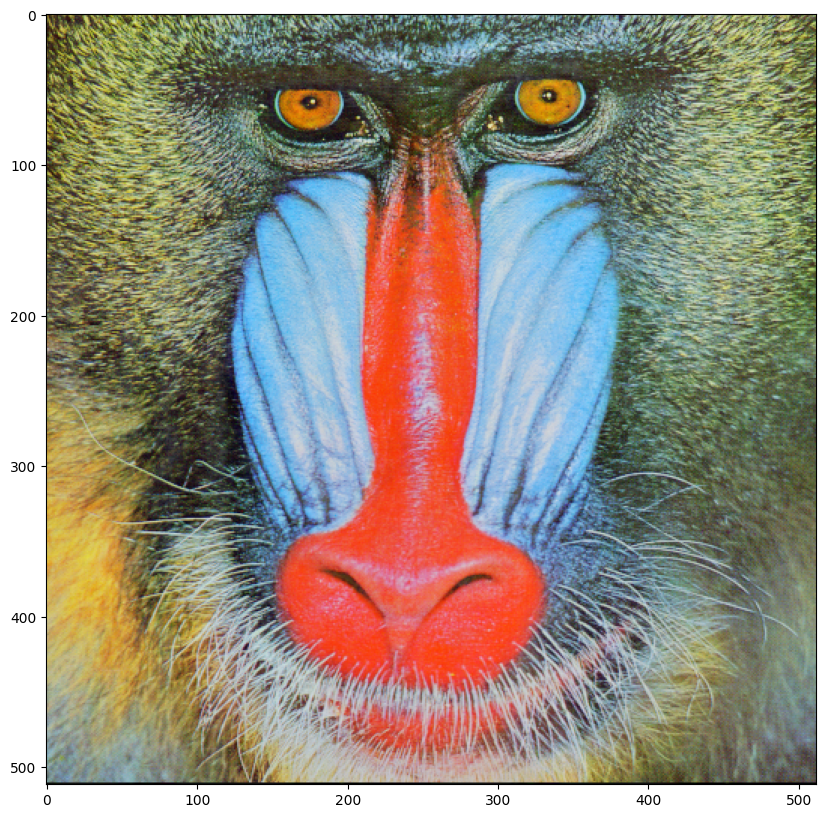

In [4]:
#Ảnh được đọc bằng thư viện OpenCV ở định dạng BGR và sau đó được chuyển sang không gian màu RGB để hiển thị chính xác bằng Matplotlib. 
baboon = cv2.imread("baboon(512x512).png")
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.show()

If we do not apply the method `copy()`, the new variable will point to the same location in memory:


In [5]:
A = baboon#Gán biến A bằng với biến baboon cả hai cùng trỏ tới cùng 1 mảng Numpy trong bộ nhớ

we use the `id` function to find the object's memory address; we see it is the same as the original array.


In [6]:
id(A)==id(baboon)#So sánh địa chỉ bộ nhớ của 2 biến A và baboon
id(A)

2773444625392

If we apply the method `copy()</coode>, the memory address is different 


In [7]:
B = baboon.copy()#Tạo một bản sao của mảng baboon
id(B)==id(baboon)#So sánh địa chỉ bộ nhớ của 2 biến B và baboon

False

When we do not apply the method <code>copy()</code>, the variable will point to the same location in memory. Consider the array <code>baboon</code>, if we set all its values to zero, then all the values in <code>A</code> will be zero. This is because <code>baboon</code> and <code>A</code> point to the same place in memory, but <code>B</code> will not be affected. 


In [8]:
baboon[:,:,] = 0#Gán toàn bộ pixel của ảnh baboon về 0

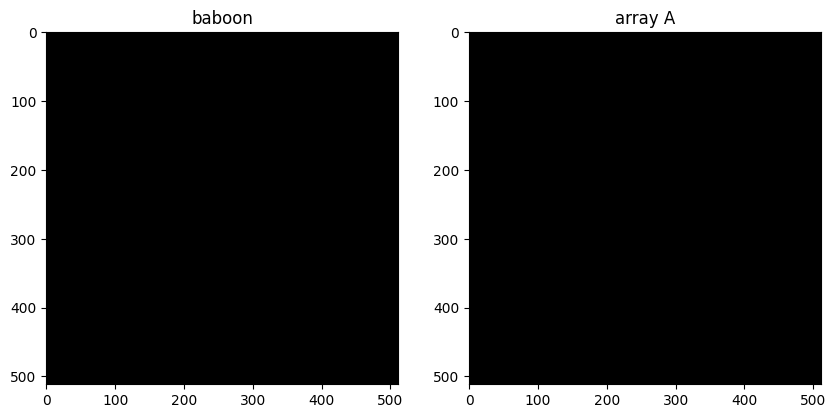

In [9]:
#so sánh ảnh baboon và ảnh A sau khi thực hiện phép gán và chỉnh sửa dữ liệu ảnh bằng NumPy.
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("baboon")
plt.subplot(122)
plt.imshow(cv2.cvtColor(A, cv2.COLOR_BGR2RGB))
plt.title("array A")
plt.show()

We see they are the same, this is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable because variables are just names that store references to values. We can also compare <code>baboon</code> and array <code>B</code>:


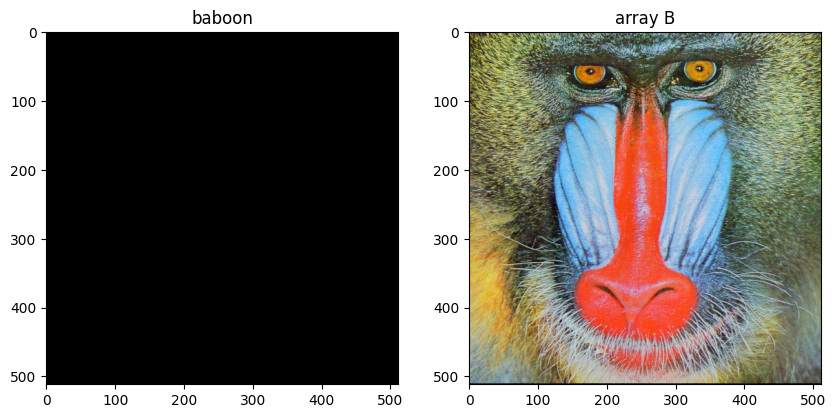

In [10]:
#so sánh ảnh baboon và ảnh B, trong đó B là bản sao độc lập của ảnh gốc được tạo bằng .copy().
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("baboon")
plt.subplot(122)
plt.imshow(cv2.cvtColor(B, cv2.COLOR_BGR2RGB))
plt.title("array B")
plt.show()


They are different because they used the method copy.


## Fliping Images 


Flipping images involves reordering the index of the pixels such that it changes the orientation of the image. Consider the following image:


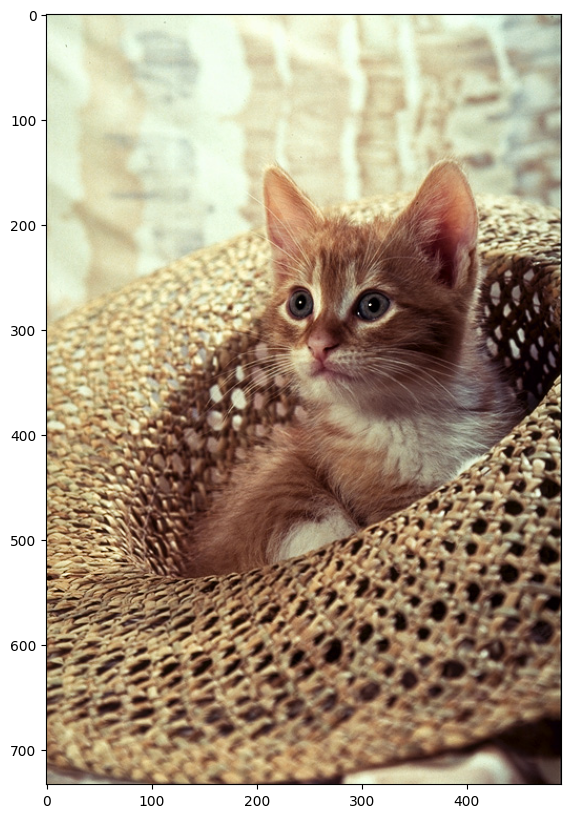

In [11]:
#đọc một ảnh bằng OpenCV và hiển thị ảnh đúng màu bằng Matplotlib.
image = cv2.imread("cat(490x733).png")
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

We can cast it to an array and find the shape:


In [12]:

width, height,C=image.shape# Lấy kích thước của ảnh từ shape
print('width, height,C',width, height,C)#Hiển thị ra kích thước ảnh và số kênh màu

width, height,C 733 490 3


Let's Flip i.e rotate it vertically. First, we create an array of equal size of type <code>np.uint8</code> bit image.


In [13]:
array_flip = np.zeros((width, height,C),dtype=np.uint8)#tạo một ảnh màu mới dưới dạng mảng NumPy với kích thước (H × W × C), tất cả pixel được khởi tạo bằng 0 và có kiểu dữ liệu uint8.

We assign the first row of pixels of the original array to the new array's last row. We repeat the process for every row, incrementing the row number for the original array and decreasing the new array's row index assigning the pixels accordingly.


In [14]:
#lật ảnh theo chiều dọc bằng cách gán các hàng pixel từ trên xuống sang vị trí đối xứng từ dưới lên trong ảnh mới.
for i,row in enumerate(image):
        array_flip[width-1-i,:,:]=row


We plot the results


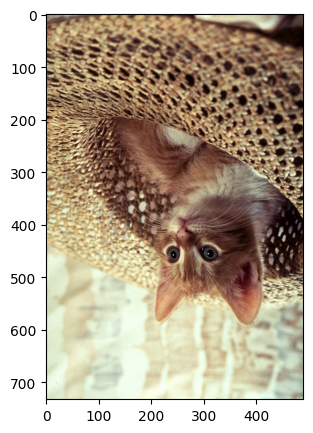

In [15]:
#hiển thị ảnh đã được lật theo chiều dọc (array_flip) sau khi xử lý bằng NumPy.
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(array_flip, cv2.COLOR_BGR2RGB))
plt.show()

<code>OpenCV</code>has several ways to flip an image, we can use  the <code>flip()</code> function; we have the input image array. The parameter is the <code>flipCode</code>

is the value indicating what kind of flip we would like to perform; 
<li><code>flipcode</code> = 0: flip vertically around the x-axis</li>
<li><code>flipcode</code> > 0: flip horizontally around y-axis positive value</li>
<li><code>flipcode</code>&#60 0: flip vertically and horizontally, flipping around both axes negative value</li>
Let apply different <code>flipcode</code>'s in a loop:


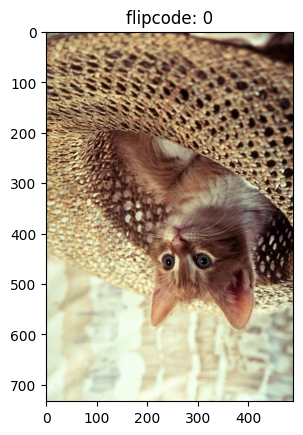

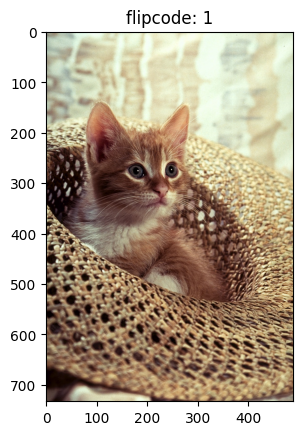

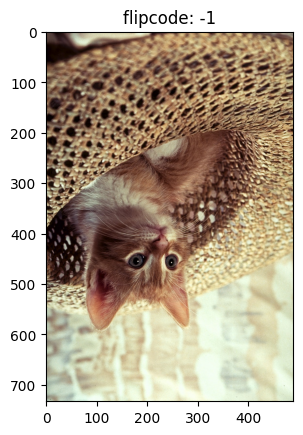

In [ ]:
#minh họa các kiểu lật ảnh khác nhau trong OpenCV thông qua tham số flipcode.
for flipcode in [0,1,-1]:
    im_flip =  cv2.flip(image,flipcode )
    plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
    plt.title("flipcode: "+str(flipcode))
    plt.show()
# 0: lât từ trên xuống theo trục x
# 1: lật từ trái sang phải theo trục y
# -1: lật cả 2 chiều    

We can also use the <code>rotate()</code> function. The parameter is an integer indicating what kind of flip we would like to perform. 


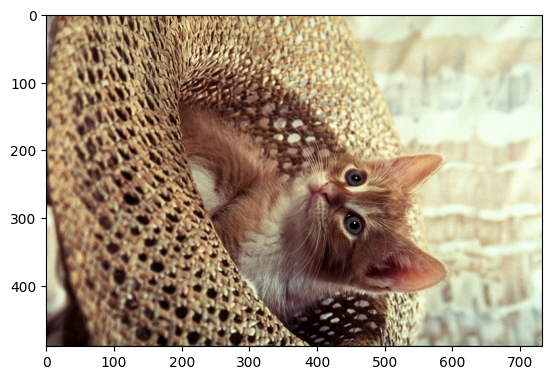

In [ ]:
#xoay (rotate) ảnh gốc để tạo ra một ảnh mới, sau đó chuyển ảnh sang hệ màu RGB và hiển thị ảnh đó ra màn hình.
im_flip = cv2.rotate(image,0)
plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
plt.show()

OpenCV module has built-in attributes the describe the type of flip, the values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {"ROTATE_90_CLOCKWISE":cv2.ROTATE_90_CLOCKWISE,"ROTATE_90_COUNTERCLOCKWISE":cv2.ROTATE_90_COUNTERCLOCKWISE,"ROTATE_180":cv2.ROTATE_180}
#tạo một dictionary tên là flip, dùng để ánh xạ tên phép xoay ảnh (dạng chuỗi) với các hằng số xoay ảnh có sẵn trong OpenCV (cv2), nhằm tiện sử dụng khi xoay ảnh bằng cv2.rotate().

We see the keys are just an integer


In [ ]:
flip["ROTATE_90_CLOCKWISE"]
#trả về hằng số cv2.ROTATE_90_CLOCKWISE, dùng để xoay ảnh 90 độ theo chiều kim đồng hồ khi truyền vào hàm cv2.rotate().

0

We can plot each of the outputs using the different  parameter values 


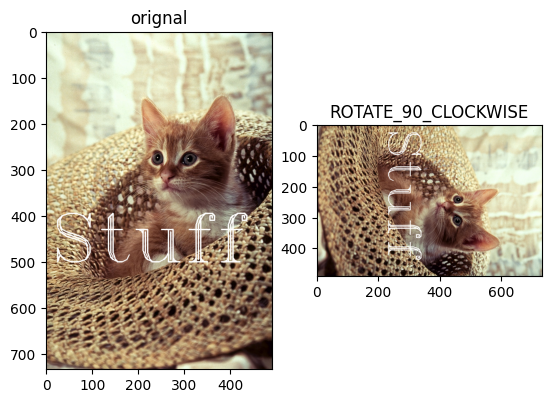

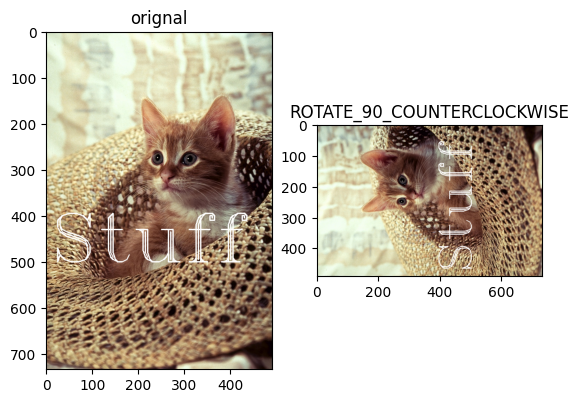

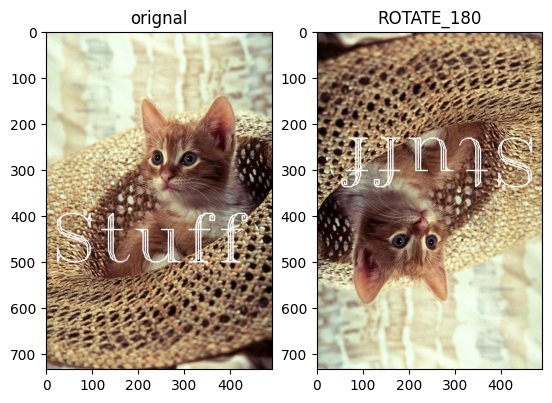

In [ ]:
#Đoạn này là để xem ảnh gốc và ảnh đã xoay (90 độ, 180 độ…) đặt cạnh nhau cho dễ so sánh.
for key, value in flip.items():
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(cv2.rotate(image,value), cv2.COLOR_BGR2RGB))
    plt.title(key)
    plt.show()

 ## Cropping an Image


Cropping is "cutting out" the part of the image and throwing out the rest; we can crop using arrays. Let start with a vertical crop; the variable <code>upper</code> is the first row that we would like to include in the image, the variable <code>lower</code> is the last row we would like to include. We then use slicing to obtain the new image. 


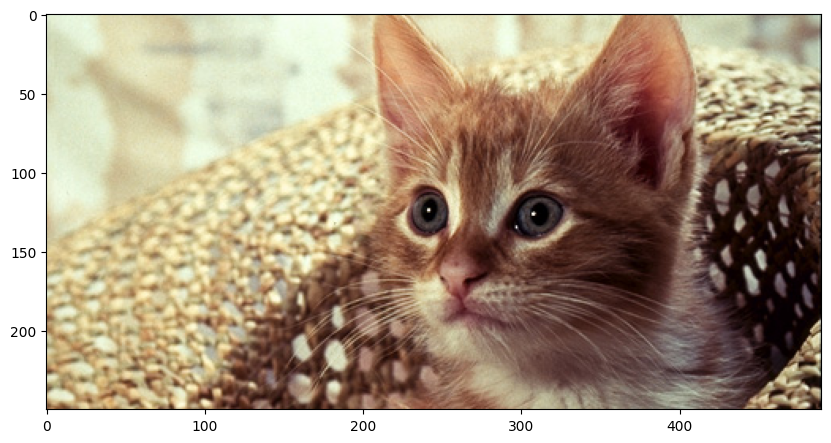

In [ ]:
#cắt một phần ảnh theo chiều dọc (trên–dưới) và hiển thị phần ảnh đã cắt.
upper = 150
lower = 400
crop_top = image[upper: lower,:,:]
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(crop_top, cv2.COLOR_BGR2RGB))
plt.show()

consider the array <code>crop_top</code> we  can also crop horizontally  the variable right is the first column that we would like to include in the image, the variable left is the last column we would like to include in the image.


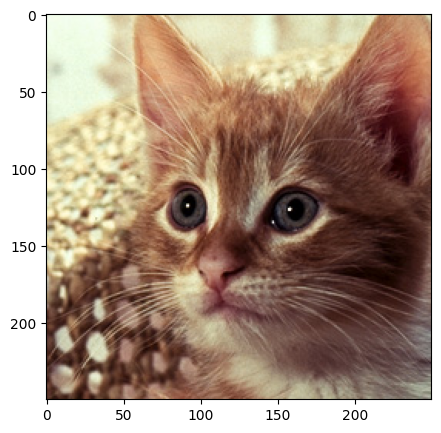

In [ ]:
#cắt một phần ảnh theo chiều ngang (trái–phải) từ ảnh đã được cắt theo chiều dọc trước đó, rồi hiển thị phần ảnh sau khi cắt
left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(crop_horizontal, cv2.COLOR_BGR2RGB))
plt.show()

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the channels in the original image we cropped to zero :


In [ ]:
#tạo một bản sao độc lập của ảnh gốc, sau đó xóa (làm đen) một vùng hình chữ nhật trong ảnh bằng cách gán giá trị pixel của vùng đó về 0.
array_sq = np.copy(image)
array_sq[upper:lower,left:right,:] = 0

We can compare the results to the new image. 


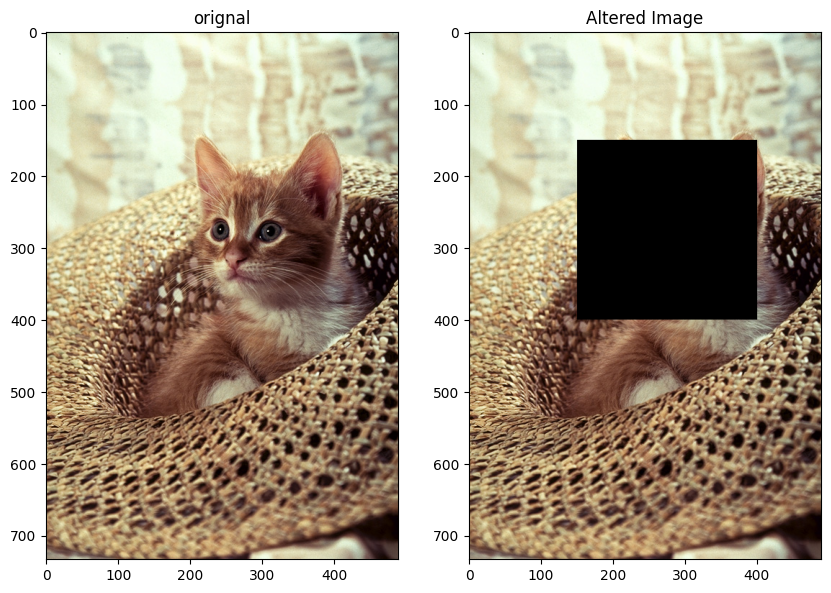

In [ ]:
#so sánh ảnh gốc và ảnh đã bị chỉnh sửa bằng cách hiển thị chúng song song.
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(array_sq,cv2.COLOR_BGR2RGB))
plt.title("Altered Image")
plt.show()

  We can also create shapes and <code>OpenCV</code>, we can use the method <code>rectangle</code>. The parameter  <code>pt1</code> is the top-left coordinate of the rectangle: <code>(left,top)</code> or $(x_0,y_0)$, <code>pt2</code> is the bottom right coordinate<code>(right,lower)</code> or $(x_1,y_1)$. The parameter <code>color</code>  is a tuple representing the intensity of each channel <code>( blue, green, red)</code>. Finally, we have the line thickness.


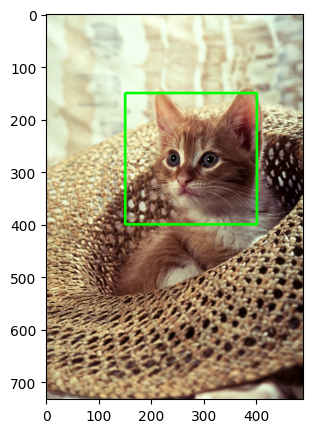

In [ ]:
#tạo một bản sao của ảnh gốc, sau đó vẽ một hình chữ nhật màu xanh lá lên ảnh để đánh dấu một vùng quan tâm, và cuối cùng hiển thị ảnh đã được vẽ khung.
start_point, end_point = (left, upper),(right, lower)
image_draw = np.copy(image)
cv2.rectangle(image_draw, pt1=start_point, pt2=end_point, color=(0, 255, 0), thickness=3) 
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(image_draw, cv2.COLOR_BGR2RGB))
plt.show()

We can overlay text on an image using the function  <code>putText</code> with the following parameter values:



 <li><code>img</code>: Image array </li>
<li><code>text</code>: Text string to be overlayed</li>
<li><code>org</code>: Bottom-left corner of the text string in the image</li>
<li><code>fontFace</code>: tye type of font </li>
<li><code>fontScale</code>: Font scale</li>
<li><code>color</code>: Text color</li>
<li><code>thickness</code>: Thickness of the lines used to draw a text</li>
<li><code>lineType:</code> Line type</li>


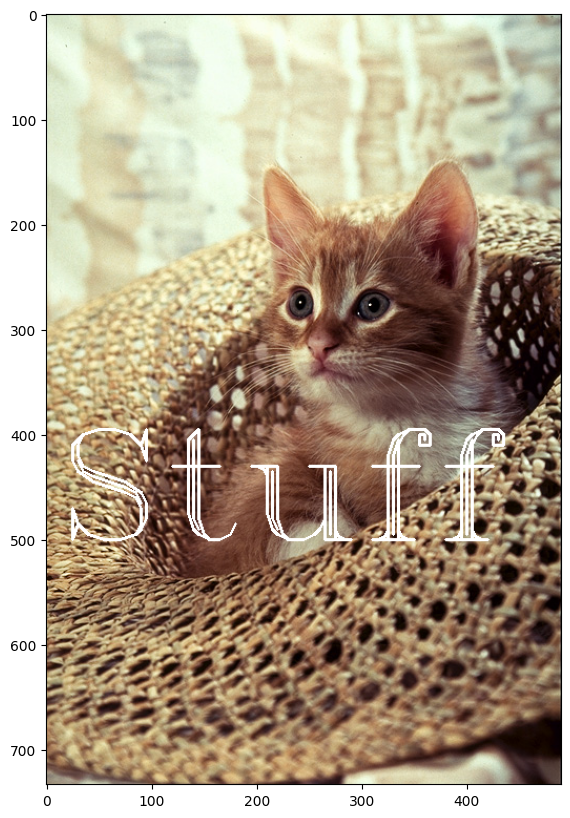

In [ ]:
#ghi chữ “Stuff” lên ảnh tại một vị trí xác định, sau đó hiển thị ảnh có chữ.
image_draw=cv2.putText(img=image,text='Stuff',org=(10,500),color=(255,255,255),fontFace=4,fontScale=5,thickness=2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image_draw,cv2.COLOR_BGR2RGB))
plt.show()

### Question-4: 
Use the image baboon.png from this lab or take any image you like.

Open the image and create a OpenCV Image object called `im`, convert the image from BGR format to RGB format, flip `im` vertically around the x-axis and create an image called `im_flip`, mirror `im` by flipping it horizontally around the y-axis and create an image called `im_mirror`, finally plot both images


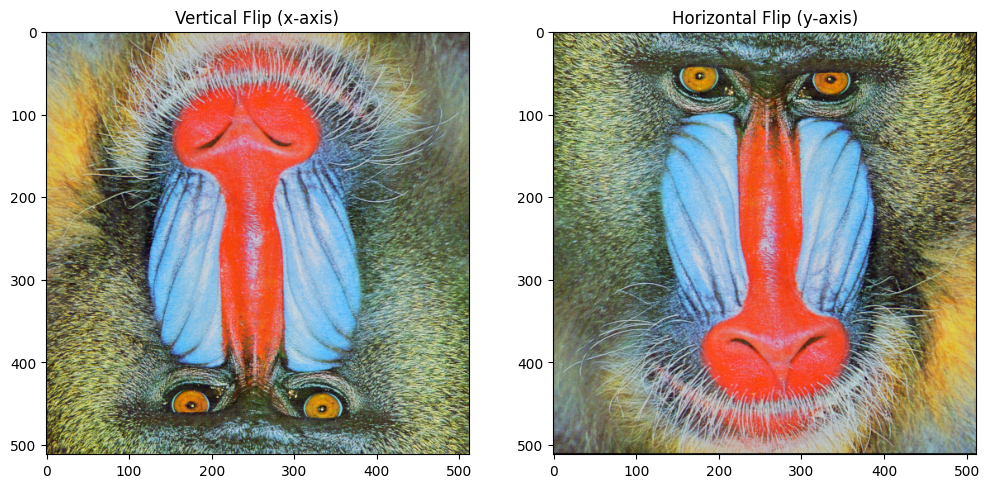

In [ ]:
# write your code here
import cv2
import matplotlib.pyplot as plt
im = cv2.imread("baboon(512x512).png")
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im_flip = cv2.flip(im_rgb, 0)
im_mirror = cv2.flip(im_rgb, 1)
plt.figure(figsize=(12,6))
plt.subplot(1,2,1) 
plt.imshow(im_flip)
plt.title("Vertical Flip (x-axis)")
plt.subplot(1,2,2) 
plt.imshow(im_mirror) 
plt.title("Horizontal Flip (y-axis)")
plt.show()
#Đoạn code mở ảnh bằng OpenCV, đổi ảnh sang hệ màu RGB, sau đó lật ảnh theo chiều dọc và chiều ngang, cuối cùng hiển thị hai ảnh đã được lật để so sánh.

Double-click **here** for a hint.

<!-- The hint is below:

im_flip =  cv2.flip(baboon,0)
im_mirror =  cv2.flip(baboon, 1)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = cv2.imread("baboon.png")

im_flip =  cv2.flip(im, 0)
plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB))
plt.show()

im_mirror =  cv2.flip(im, 1)
plt.imshow(cv2.cvtColor(im_mirror, cv2.COLOR_BGR2RGB))
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->


<h3 align="center"> &#169; IBM Corporation. All rights reserved. <h3/>
